# KAGGLE COMPETITION

# HMS - Harmful Brain Activity Classification

### IMPORTING THE NECESSARY LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

## LOADING THE DATASET

In [3]:
df = pd.read_csv("/kaggle/input/hms-harmful-brain-activity-classification/train.csv")

In [4]:
df.head()

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0


### BASIC CHECKS

In [5]:
df.tail()

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0
106799,351917269,10,20.0,2147388374,10,20.0,3642716176,10351,LRDA,0,0,0,3,0,0


In [6]:
df.shape

(106800, 15)

In [7]:
df.columns

Index(['eeg_id', 'eeg_sub_id', 'eeg_label_offset_seconds', 'spectrogram_id',
       'spectrogram_sub_id', 'spectrogram_label_offset_seconds', 'label_id',
       'patient_id', 'expert_consensus', 'seizure_vote', 'lpd_vote',
       'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote'],
      dtype='object')

## DATA ANALYSIS

1. **`eeg_id`**: Unique identifier for the entire EEG recording. It represents a specific EEG session or recording from a patient.

2. **`eeg_sub_id`**: An ID for the specific 50-second long subsample to which the row's labels apply. This column helps identify a particular subset or segment within the larger EEG recording.

3. **`eeg_label_offset_seconds`**: The time between the beginning of the consolidated EEG and the subsample. It indicates the time offset for the EEG subsample within the entire EEG recording.

4. **`spectrogram_id`**: Unique identifier for the entire EEG recording, similar to `eeg_id`. It is related to the spectrogram data.

5. **`spectrogram_sub_id`**: An ID for the specific 10-minute subsample to which the row's labels apply. This corresponds to a subset within the larger spectrogram data.

6. **`spectrogram_label_offset_seconds`**: The time between the beginning of the consolidated spectrogram and the subsample. It indicates the time offset for the spectrogram subsample within the entire spectrogram recording.

7. **`label_id`**: An ID for this set of labels. It helps distinguish different sets of labels within the dataset.

8. **`patient_id`**: An ID for the patient who donated the data. It uniquely identifies each patient.

9. **`expert_consensus`**: The consensus annotator label for convenience. This column may provide a summary or agreement among expert annotators regarding the type of brain activity in the given subsample.

10. **`seizure_vote`**, **`lpd_vote`**, **`gpd_vote`**, **`lrda_vote`**, **`grda_vote`**, **`other_vote`**: These columns represent the count of annotator votes for specific brain activity classes. The classes are:
    - `seizure_vote`: Count of votes for seizure.
    - `lpd_vote`: Count of votes for lateralized periodic discharges.
    - `gpd_vote`: Count of votes for generalized periodic discharges.
    - `lrda_vote`: Count of votes for lateralized rhythmic delta activity.
    - `grda_vote`: Count of votes for generalized rhythmic delta activity.
    - `other_vote`: Count of votes for other types of brain activity.

11. **Target Variable**: The target variable in this dataset is the actual brain activity class for each subsample. It could be any of the following:
    - Seizure (`seizure_vote`): Represents the count of votes for seizure.
    - Lateralized Periodic Discharges (`lpd_vote`): Represents the count of votes for lateralized periodic discharges.
    - Generalized Periodic Discharges (`gpd_vote`): Represents the count of votes for generalized periodic discharges.
    - Lateralized Rhythmic Delta Activity (`lrda_vote`): Represents the count of votes for lateralized rhythmic delta activity.
    - Generalized Rhythmic Delta Activity (`grda_vote`): Represents the count of votes for generalized rhythmic delta activity.
    - Other (`other_vote`): Represents the count of votes for other types of brain activity.

The target variable is the type of brain activity class (seizure, lpd, gpd, lrda, grda, other), and the goal of the competition or analysis is likely to predict or classify the correct brain activity class for each EEG subsample.

In [8]:
df.isnull().sum()

eeg_id                              0
eeg_sub_id                          0
eeg_label_offset_seconds            0
spectrogram_id                      0
spectrogram_sub_id                  0
spectrogram_label_offset_seconds    0
label_id                            0
patient_id                          0
expert_consensus                    0
seizure_vote                        0
lpd_vote                            0
gpd_vote                            0
lrda_vote                           0
grda_vote                           0
other_vote                          0
dtype: int64

In [9]:
df.nunique()

eeg_id                               17089
eeg_sub_id                             743
eeg_label_offset_seconds              1502
spectrogram_id                       11138
spectrogram_sub_id                    1022
spectrogram_label_offset_seconds      4686
label_id                            106800
patient_id                            1950
expert_consensus                         6
seizure_vote                            18
lpd_vote                                19
gpd_vote                                17
lrda_vote                               16
grda_vote                               16
other_vote                              26
dtype: int64

In [10]:
object_columns = df.select_dtypes(include=['object', 'bool']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['expert_consensus'], dtype='object')

Numerical type columns:
Index(['eeg_id', 'eeg_sub_id', 'eeg_label_offset_seconds', 'spectrogram_id',
       'spectrogram_sub_id', 'spectrogram_label_offset_seconds', 'label_id',
       'patient_id', 'seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote',
       'grda_vote', 'other_vote'],
      dtype='object')


In [11]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype in ['object', 'bool']:
            if df[column].nunique() < 15:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [12]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [13]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['expert_consensus']
Non-Categorical Features: []
Discrete Features: []
Continuous Features: ['eeg_id', 'eeg_sub_id', 'eeg_label_offset_seconds', 'spectrogram_id', 'spectrogram_sub_id', 'spectrogram_label_offset_seconds', 'label_id', 'patient_id', 'seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']


In [14]:
for i in categorical:
    print(i, ':')
    print(df[i].unique())
    print()

expert_consensus :
['Seizure' 'GPD' 'LRDA' 'Other' 'GRDA' 'LPD']



In [15]:
for i in categorical:
    print(i, ':')
    print(df[i].value_counts())
    print()

expert_consensus :
expert_consensus
Seizure    20933
GRDA       18861
Other      18808
GPD        16702
LRDA       16640
LPD        14856
Name: count, dtype: int64



## EXPLORATORY DATA ANALYSIS

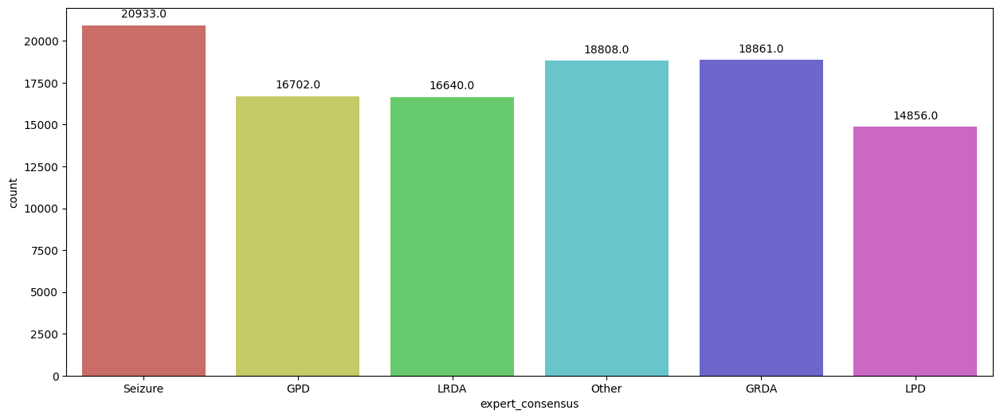

In [16]:
for i in categorical:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=df, palette='hls')
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    plt.show()

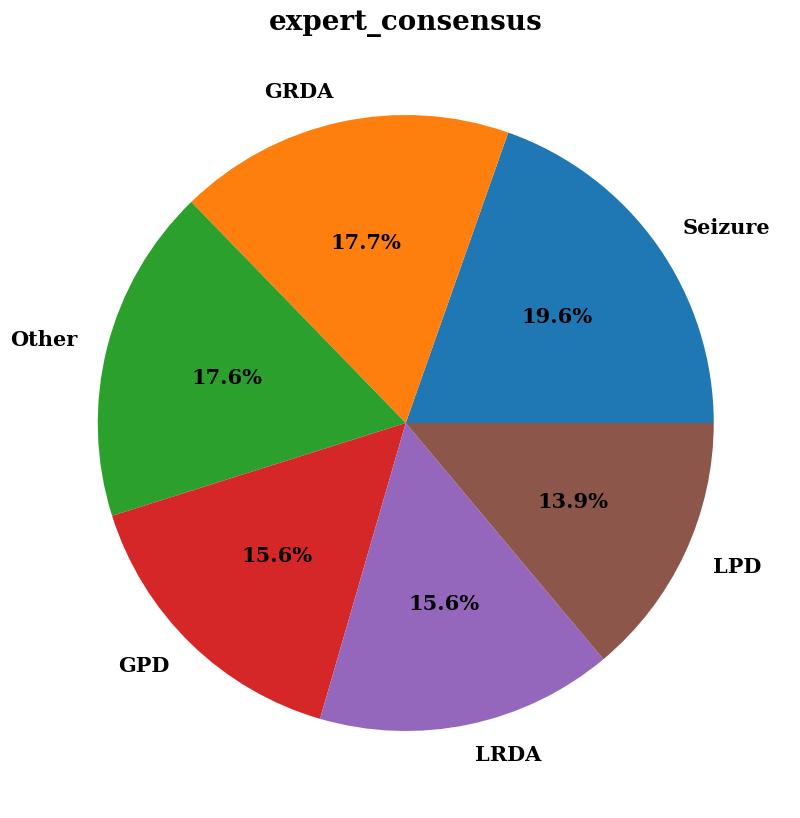

In [17]:
for i in categorical:
    plt.figure(figsize=(20,10))
    plt.pie(df[i].value_counts(), labels=df[i].value_counts().index, autopct='%1.1f%%', textprops={'fontsize': 15,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
    hfont = {'fontname':'serif', 'weight': 'bold'}
    plt.title(i, size=20, **hfont)
    plt.show()

In [18]:
votes_columns = ['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']
df_votes = df[votes_columns].melt(var_name='Brain Activity', value_name='Votes')

1. **`votes_columns`**: This is a list containing the names of columns in your original DataFrame (`df`) that represent the counts of votes for different brain activity classes. Each element in the list corresponds to a specific brain activity class.

2. **`df_votes`**: This line creates a new DataFrame (`df_votes`) by selecting only the columns specified in `votes_columns` from the original DataFrame (`df`). The selected columns are essentially the counts of votes for different brain activity classes.

3. **`.melt(var_name='Brain Activity', value_name='Votes')`**: This part of the code transforms the DataFrame from wide format to long format using the `melt` function. It takes the selected columns (`votes_columns`) and "melts" or unpivots them, creating two new columns:
   - `Brain Activity`: This column stores the variable names from the original DataFrame (`df`) that represent different brain activity classes (e.g., 'seizure_vote', 'lpd_vote', etc.).
   - `Votes`: This column stores the corresponding values (vote counts) for each brain activity class.

In [19]:
df_votes

,Brain Activity,Votes
0,seizure_vote,3
1,seizure_vote,3
2,seizure_vote,3
3,seizure_vote,3
4,seizure_vote,3
...,...,...
640795,other_vote,0
640796,other_vote,0
640797,other_vote,0
640798,other_vote,0


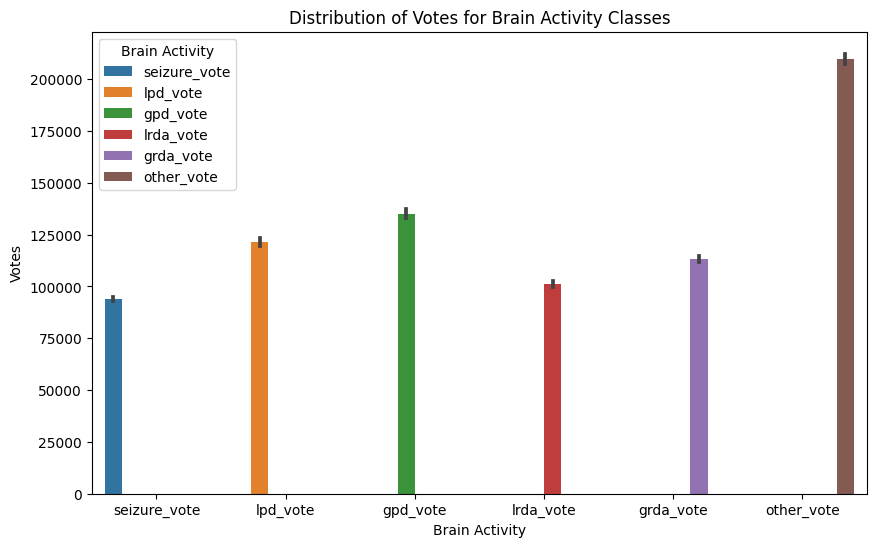

In [20]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Brain Activity', y='Votes', hue='Brain Activity', data=df_votes, estimator=sum)
plt.title('Distribution of Votes for Brain Activity Classes')
plt.show()

In [21]:
votes_sum = df_votes.groupby('Brain Activity')['Votes'].sum()


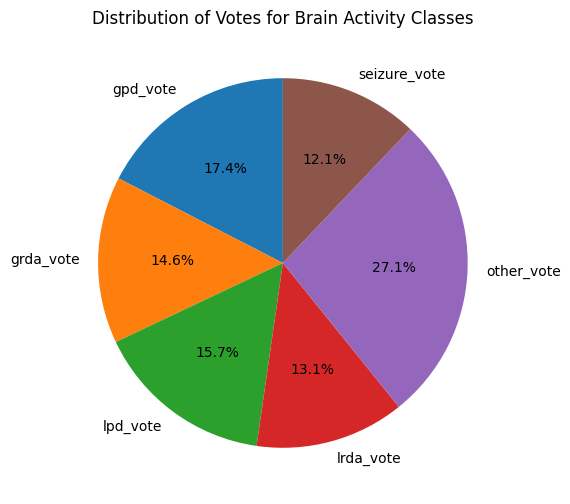

In [22]:

plt.figure(figsize=(10, 6))
plt.pie(votes_sum, labels=votes_sum.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Votes for Brain Activity Classes')
plt.show()

In [23]:
df_vote_columns = df[votes_columns]

In [24]:
df_votes

,Brain Activity,Votes
0,seizure_vote,3
1,seizure_vote,3
2,seizure_vote,3
3,seizure_vote,3
4,seizure_vote,3
...,...,...
640795,other_vote,0
640796,other_vote,0
640797,other_vote,0
640798,other_vote,0


In [25]:
df_vote_columns

,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,3,0,0,0,0,0
1,3,0,0,0,0,0
2,3,0,0,0,0,0
3,3,0,0,0,0,0
4,3,0,0,0,0,0
...,...,...,...,...,...,...
106795,0,0,0,3,0,0
106796,0,0,0,3,0,0
106797,0,0,0,3,0,0
106798,0,0,0,3,0,0


In [26]:
pivot_table_continuous = pd.pivot_table(df, values=continuous, index='expert_consensus', aggfunc='mean', fill_value=0)
pivot_table_continuous

,eeg_id,eeg_label_offset_seconds,eeg_sub_id,gpd_vote,grda_vote,label_id,lpd_vote,lrda_vote,other_vote,patient_id,seizure_vote,spectrogram_id,spectrogram_label_offset_seconds,spectrogram_sub_id
expert_consensus,,,,,,,,,,,,,,
GPD,2.112607e+09,271.789007,60.594001,7.136630,0.327685,2.137788e+09,0.465932,0.056161,0.977967,30894.480362,1.073823,1.012988e+09,681.736199,75.243384
GRDA,2.122264e+09,164.003181,34.889295,0.196119,4.516569,2.139416e+09,0.101161,0.252214,0.974286,31341.035947,0.030751,1.115632e+09,303.706590,44.237951
LPD,2.009430e+09,105.365778,14.422052,0.275714,0.110057,2.135262e+09,6.303177,0.652329,0.982970,33153.806745,0.272079,1.081675e+09,1248.156637,67.645665
LRDA,2.060360e+09,111.167668,41.686238,0.076082,0.437500,2.142999e+09,0.469712,4.535697,1.351863,33981.688041,0.141286,1.046095e+09,516.924760,61.317127
Other,2.148688e+09,25.629307,3.607295,0.291631,0.702573,2.143698e+09,0.471874,0.507337,7.204275,33263.351287,0.155997,1.073661e+09,346.593258,13.892333
Seizure,2.144307e+09,55.406105,7.715951,0.064587,0.015860,2.147165e+09,0.076482,0.041848,0.128649,31499.771652,3.149620,1.067833e+09,229.519753,14.002436


1. **eeg_id:**
   - GPD has an average EEG recording identifier of approximately 2.1126e+09.
   - Other classes have varying average EEG recording identifiers.

   **Interpretation:** The average EEG recording identifier may not provide direct insights into the characteristics of brain activity classes.

2. **eeg_label_offset_seconds:**
   - GPD has an average EEG label offset of approximately 271.79 seconds.
   - Other classes have varying average EEG label offsets.

   **Interpretation:** GPD tends to have EEG signals labeled around 271.79 seconds, suggesting a specific temporal pattern associated with this class.

3. **spectrogram_id:**
   - GPD has an average spectrogram identifier of approximately 1.01299e+09.
   - Other classes have varying average spectrogram identifiers.

   **Interpretation:** The average spectrogram identifier for GPD may indicate a specific pattern or set of characteristics in the spectrogram associated with this class.

4. **seizure_vote:**
   - Seizure has the highest average vote count, indicating a higher level of agreement among annotators for this class.
   - Other classes have lower average vote counts.

   **Interpretation:** Seizure tends to have a higher level of agreement among annotators, suggesting that it might be a more easily identifiable brain activity class compared to others.

These interpretations provide a high-level understanding of the average characteristics associated with different brain activity classes based on the provided features. It's important to note that further in-depth analysis and domain expertise may be required to draw more specific conclusions about the significance of these averages in the context of EEG signal processing and brain activity classification.

In [27]:
df['Brain Activity'] = df[votes_columns].idxmax(axis=1).apply(lambda x: x.replace('_vote', ''))

In [28]:
df

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,Brain Activity
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0,seizure
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0,seizure
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0,seizure
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0,seizure
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0,seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0,lrda
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0,lrda
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0,lrda
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0,lrda


In [29]:
grouped_continuous = df.groupby('eeg_id')[continuous].mean().reset_index(drop=True)
grouped_continuous

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,5.686570e+05,1.5,8.500000,7.895773e+08,1.5,8.500000,2.176284e+09,20654.0,0.0,0.0,3.0,0.0,2.0,7.0
1,5.829990e+05,5.0,17.454545,1.552638e+09,5.0,17.454545,1.677750e+09,20230.0,0.0,12.0,0.0,1.0,0.0,1.0
2,6.423820e+05,0.5,12.000000,1.496020e+07,12.5,1020.000000,2.903413e+09,5955.0,0.0,0.0,0.0,0.0,0.0,1.0
3,7.517900e+05,0.0,0.000000,6.187284e+08,4.0,908.000000,2.898467e+09,38549.0,0.0,0.0,1.0,0.0,0.0,0.0
4,7.787050e+05,0.0,0.000000,5.229632e+07,0.0,0.000000,3.255875e+09,40955.0,0.0,0.0,0.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,4.293354e+09,0.0,0.000000,1.188114e+09,0.0,0.000000,4.472442e+08,16610.0,0.0,0.0,0.0,0.0,1.0,1.0
17085,4.293843e+09,0.0,0.000000,1.549503e+09,0.0,0.000000,1.618953e+09,15065.0,0.0,0.0,0.0,0.0,1.0,1.0
17086,4.294455e+09,0.0,0.000000,2.105480e+09,0.0,0.000000,4.695264e+08,56.0,0.0,0.0,0.0,0.0,0.0,1.0
17087,4.294859e+09,2.0,5.600000,6.572992e+08,2.0,5.600000,2.652198e+09,4312.0,0.0,0.0,0.0,0.0,1.0,14.0


In [30]:
targets = ['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']

In [31]:
total_votes_per_pat = df.groupby('patient_id')[targets].sum().sum(axis=1)
normalized_votes = df.groupby('patient_id')[targets].sum().div(total_votes_per_pat, axis=0)
mean_vote_ratio = normalized_votes.mean()
print( mean_vote_ratio )

seizure_vote    0.310718
lpd_vote        0.046279
gpd_vote        0.051885
lrda_vote       0.081796
grda_vote       0.231471
other_vote      0.277851
dtype: float64


In [32]:
target_eeg_id = 1000913311
df_filtered = df[df['eeg_id'] == target_eeg_id]
df_filtered

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,Brain Activity
9529,1000913311,0,0.0,175871552,0,0.0,3905268514,59743,Other,0,0,0,0,0,2,other


1000086677.parquet

In [33]:
df_filtered = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/1000913311.parquet')

In [34]:
df_filtered

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-105.849998,-89.230003,-79.459999,-49.230000,-99.730003,-87.769997,-53.330002,-50.740002,-32.250000,-42.099998,-43.270000,-88.730003,-74.410004,-92.459999,-58.930000,-75.739998,-59.470001,8.210000,66.489998,1404.930054
1,-85.470001,-75.070000,-60.259998,-38.919998,-73.080002,-87.510002,-39.680000,-35.630001,-76.839996,-62.740002,-43.040001,-68.629997,-61.689999,-69.320000,-35.790001,-58.900002,-41.660000,196.190002,230.669998,3402.669922
2,8.840000,34.849998,56.430000,67.970001,48.099998,25.350000,80.250000,48.060001,6.720000,37.880001,61.000000,16.580000,55.060001,45.020000,70.529999,47.820000,72.029999,-67.180000,-171.309998,-3565.800049
3,-56.320000,-37.279999,-28.100000,-2.820000,-43.430000,-35.049999,3.910000,-12.660000,8.650000,3.830000,4.180000,-51.900002,-21.889999,-41.330002,-11.580000,-27.040001,-11.730000,-91.000000,-81.190002,-1280.930054
4,-110.139999,-104.519997,-96.879997,-70.250000,-111.660004,-114.430000,-71.830002,-61.919998,-76.150002,-79.779999,-67.480003,-99.029999,-93.610001,-104.410004,-70.070000,-89.250000,-77.260002,155.729996,264.850006,4325.370117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-45.540001,-26.459999,-23.209999,-25.250000,-21.559999,-36.549999,10.730000,-16.290001,-55.919998,-28.670000,-29.770000,-22.000000,3.710000,8.470000,0.480000,9.950000,33.959999,110.510002,58.599998,301.239990
9996,-26.860001,4.350000,7.410000,7.830000,5.260000,7.750000,50.130001,4.150000,1.720000,22.100000,7.150000,-6.820000,38.070000,32.880001,21.990000,32.990002,60.209999,-156.949997,-275.929993,-4634.799805
9997,-133.759995,-111.190002,-119.180000,-105.760002,-130.039993,-104.059998,-68.290001,-86.480003,-57.130001,-68.830002,-95.839996,-107.540001,-86.449997,-94.099998,-97.050003,-86.339996,-68.040001,-14.880000,66.440002,1667.800049
9998,-78.889999,-59.660000,-60.770000,-59.810001,-63.020000,-60.020000,-20.690001,-42.820000,-68.669998,-54.740002,-62.810001,-52.869999,-34.099998,-31.500000,-37.810001,-32.259998,-10.870000,137.559998,193.839996,2743.379883


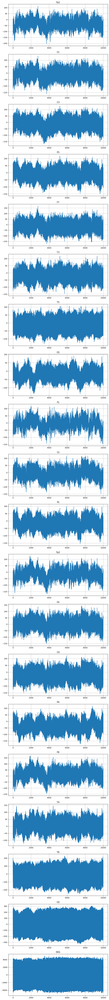

In [35]:
fig, ax = plt.subplots(20, figsize=(10, 100))

for i, column in enumerate(df_filtered.columns):
    ax[i].plot(df_filtered.index, df_filtered[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

Data has a lot of peaks and troughs, indicating a high variation
The scale of most of the plots ranging from -200 to 100, excluding EKG chart
The line seems to fluctuate above and below a central value, which seems to be around zero value

In [36]:
df_filtered.shape

(10000, 20)

In [37]:
df_filtered.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG'],
      dtype='object')

The list of labels you provided appears to represent different electrode locations in an electroencephalography (EEG) recording setup. Each label corresponds to a specific position on the scalp where electrodes are placed to capture electrical activity from different regions of the brain. Let's break down each label:

1. **Fp1 and Fp2:**
   - These are frontal polar electrodes.
   - Positioned on the forehead, they capture electrical activity from the frontal lobes, which are associated with cognitive functions, decision-making, and personality.

2. **F3, F4, F7, and F8:**
   - These electrodes are located in the frontal region.
   - They capture electrical signals from the frontal lobes, contributing to the analysis of cognitive processes and emotional states.

3. **C3 and C4:**
   - These are central electrodes.
   - Positioned over the central region of the scalp, they record activity from the central sulcus area, involved in motor control and sensory processing.

4. **P3 and P4:**
   - These electrodes are located in the parietal region.
   - They capture signals related to sensory processing, spatial awareness, and interpretation of visual information.

5. **Fz, Cz, and Pz:**
   - These are midline electrodes located at the vertex (top) of the head.
   - Fz captures activity from the frontal midline, Cz from the central midline, and Pz from the parietal midline. These are important for analyzing midline brain functions.

6. **T3, T4, T5, and T6:**
   - These electrodes are positioned in the temporal region.
   - They record electrical activity from the temporal lobes, which are involved in auditory processing, memory, and language.

7. **O1 and O2:**
   - These electrodes are located in the occipital region.
   - They capture signals from the occipital lobes, primarily responsible for visual processing.

8. **EKG:**
   - This electrode records electrocardiogram (EKG or ECG) signals from the heart.
   - While not directly related to brain activity, it is often included in EEG setups to monitor cardiac activity, allowing for correlation with potential physiological effects on the EEG.

These electrode locations collectively provide a comprehensive view of brain activity, enabling the analysis of different cognitive and sensory functions. EEG recordings from these electrodes help researchers and clinicians understand brain dynamics and detect abnormalities in various neurological conditions.

In [38]:
df1 = df_filtered.copy()

In [39]:
df1['Brain Activity'] = 'other'

In [40]:
df1

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-105.849998,-89.230003,-79.459999,-49.230000,-99.730003,-87.769997,-53.330002,-50.740002,-32.250000,-42.099998,...,-88.730003,-74.410004,-92.459999,-58.930000,-75.739998,-59.470001,8.210000,66.489998,1404.930054,other
1,-85.470001,-75.070000,-60.259998,-38.919998,-73.080002,-87.510002,-39.680000,-35.630001,-76.839996,-62.740002,...,-68.629997,-61.689999,-69.320000,-35.790001,-58.900002,-41.660000,196.190002,230.669998,3402.669922,other
2,8.840000,34.849998,56.430000,67.970001,48.099998,25.350000,80.250000,48.060001,6.720000,37.880001,...,16.580000,55.060001,45.020000,70.529999,47.820000,72.029999,-67.180000,-171.309998,-3565.800049,other
3,-56.320000,-37.279999,-28.100000,-2.820000,-43.430000,-35.049999,3.910000,-12.660000,8.650000,3.830000,...,-51.900002,-21.889999,-41.330002,-11.580000,-27.040001,-11.730000,-91.000000,-81.190002,-1280.930054,other
4,-110.139999,-104.519997,-96.879997,-70.250000,-111.660004,-114.430000,-71.830002,-61.919998,-76.150002,-79.779999,...,-99.029999,-93.610001,-104.410004,-70.070000,-89.250000,-77.260002,155.729996,264.850006,4325.370117,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-45.540001,-26.459999,-23.209999,-25.250000,-21.559999,-36.549999,10.730000,-16.290001,-55.919998,-28.670000,...,-22.000000,3.710000,8.470000,0.480000,9.950000,33.959999,110.510002,58.599998,301.239990,other
9996,-26.860001,4.350000,7.410000,7.830000,5.260000,7.750000,50.130001,4.150000,1.720000,22.100000,...,-6.820000,38.070000,32.880001,21.990000,32.990002,60.209999,-156.949997,-275.929993,-4634.799805,other
9997,-133.759995,-111.190002,-119.180000,-105.760002,-130.039993,-104.059998,-68.290001,-86.480003,-57.130001,-68.830002,...,-107.540001,-86.449997,-94.099998,-97.050003,-86.339996,-68.040001,-14.880000,66.440002,1667.800049,other
9998,-78.889999,-59.660000,-60.770000,-59.810001,-63.020000,-60.020000,-20.690001,-42.820000,-68.669998,-54.740002,...,-52.869999,-34.099998,-31.500000,-37.810001,-32.259998,-10.870000,137.559998,193.839996,2743.379883,other


In [41]:
electrodes = ['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz', 'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG']

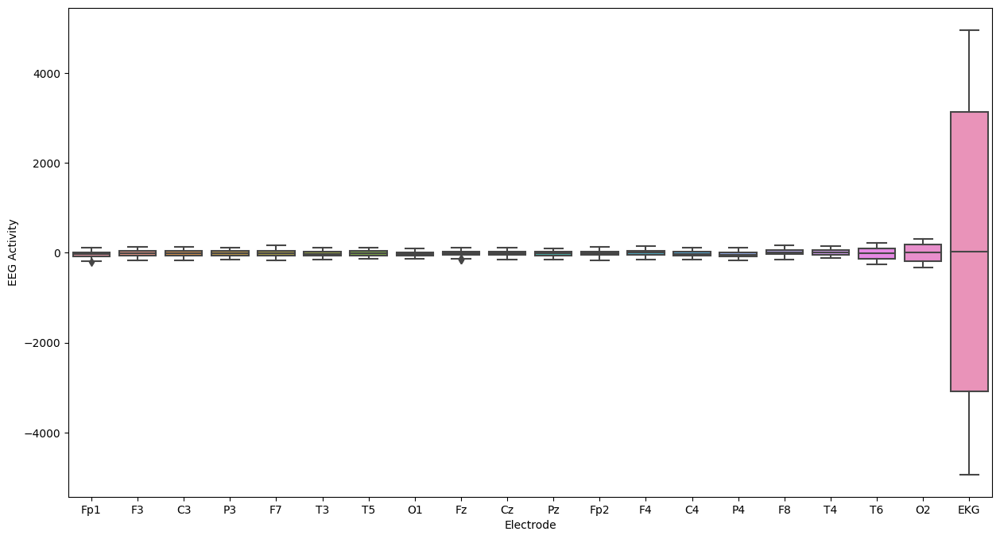

In [42]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df1[electrodes])
plt.xlabel('Electrode')
plt.ylabel('EEG Activity')
plt.show()

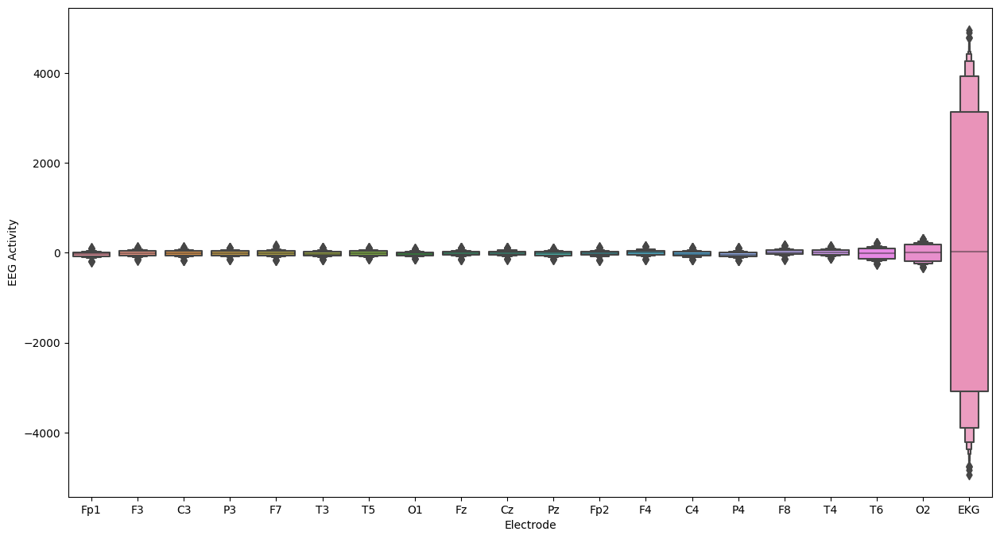

In [43]:
plt.figure(figsize=(15, 8))
sns.boxenplot(data=df1[electrodes])
plt.xlabel('Electrode')
plt.ylabel('EEG Activity')
plt.show()

In [44]:
df.columns

Index(['eeg_id', 'eeg_sub_id', 'eeg_label_offset_seconds', 'spectrogram_id',
       'spectrogram_sub_id', 'spectrogram_label_offset_seconds', 'label_id',
       'patient_id', 'expert_consensus', 'seizure_vote', 'lpd_vote',
       'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote', 'Brain Activity'],
      dtype='object')

In [45]:
unique_eeg_ids = df.drop_duplicates(subset='Brain Activity')['eeg_id'].tolist()
print(unique_eeg_ids)

[1628180742, 2277392603, 722738444, 1202099836, 2578018731, 736446371]


In [46]:
eeg_activity_dict = {}

for eeg_id in unique_eeg_ids:
    subset_df = df[df['eeg_id'] == eeg_id]

    unique_brain_activity = subset_df['Brain Activity'].unique()

    if len(unique_brain_activity) == 1:
        eeg_activity_dict[eeg_id] = unique_brain_activity[0]

print(eeg_activity_dict)

{1628180742: 'seizure', 2277392603: 'gpd', 722738444: 'lrda', 1202099836: 'other', 736446371: 'lpd'}


1. `eeg_activity_dict = {}`: Initializes an empty dictionary to store EEG IDs and their corresponding brain activities.

2. `for eeg_id in unique_eeg_ids:`: Iterates through each unique EEG ID.

3. `subset_df = df[df['eeg_id'] == eeg_id]`: Creates a subset DataFrame (`subset_df`) containing only rows where the 'eeg_id' column matches the current `eeg_id`.

4. `unique_brain_activity = subset_df['Brain Activity'].unique()`: Extracts unique values from the 'Brain Activity' column within the subset DataFrame.

5. `if len(unique_brain_activity) == 1:`: Checks if there is only one unique brain activity in the subset.

6. `eeg_activity_dict[eeg_id] = unique_brain_activity[0]`: If there is only one unique brain activity, it adds an entry to the dictionary with the EEG ID as the key and the unique brain activity as the value.

7. Finally, the dictionary `eeg_activity_dict` contains mappings from unique EEG IDs to their corresponding unique brain activities.

In [47]:
 df[df['eeg_id'] == 1628180742]

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,Brain Activity
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0,seizure
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0,seizure
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0,seizure
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0,seizure
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0,seizure
5,1628180742,5,26.0,353733,5,26.0,2413091605,42516,Seizure,3,0,0,0,0,0,seizure
6,1628180742,6,30.0,353733,6,30.0,364593930,42516,Seizure,3,0,0,0,0,0,seizure
7,1628180742,7,36.0,353733,7,36.0,3811483573,42516,Seizure,3,0,0,0,0,0,seizure
8,1628180742,8,40.0,353733,8,40.0,3388718494,42516,Seizure,3,0,0,0,0,0,seizure


In [48]:
df1 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/1628180742.parquet')

In [49]:
df1.head()

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997


In [50]:
df2 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/736446371.parquet')

In [51]:
df3 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/722738444.parquet')

In [52]:
df4 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/1202099836.parquet')

In [53]:
df5 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2578018731.parquet')

In [54]:
df6 = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/train_eegs/2277392603.parquet')

In [55]:
df1['Brain Activity'] = 'seizure'

In [56]:
df1.head()

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,...,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000,seizure
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,...,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999,seizure
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,...,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002,seizure
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,...,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003,seizure
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,...,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997,seizure


In [57]:
df2['Brain Activity'] = 'lpd'

In [58]:
df3['Brain Activity'] = 'lrda'

In [59]:
df4['Brain Activity'] = 'other'

In [60]:
df5['Brain Activity'] = 'grda'

In [61]:
df6['Brain Activity'] = 'gpd'

In [62]:
df1

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,...,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000,seizure
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,...,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999,seizure
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,...,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002,seizure
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,...,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003,seizure
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,...,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997,seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,-144.660004,-147.809998,-129.820007,-129.460007,-157.509995,-124.000000,-124.570000,-94.820000,-153.070007,-121.110001,...,-132.520004,-138.339996,-128.970001,-71.300003,-114.480003,-86.709999,-114.959999,-81.500000,-20.070000,seizure
17996,-140.880005,-153.000000,-129.529999,-129.020004,-154.059998,-131.220001,-128.380005,-95.000000,-140.820007,-114.639999,...,-115.339996,-119.230003,-114.709999,-70.989998,-92.129997,-79.639999,-116.139999,-81.879997,10.600000,seizure
17997,-133.729996,-141.770004,-121.900002,-122.370003,-158.750000,-123.550003,-127.730003,-93.089996,-125.230003,-106.489998,...,-112.720001,-103.209999,-107.629997,-61.869999,-97.910004,-77.150002,-106.500000,-75.339996,-2.060000,seizure
17998,-141.449997,-151.139999,-127.190002,-128.699997,-163.460007,-124.309998,-129.479996,-94.419998,-140.869995,-113.339996,...,-129.300003,-118.650002,-117.589996,-71.879997,-99.279999,-83.900002,-116.160004,-81.410004,2.820000,seizure


In [63]:
df2

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-24.080000,-64.980003,-104.070000,-59.380001,-61.980000,-106.900002,-54.259998,-71.720001,1.130000,7.830000,...,-13.420000,-31.660000,-12.420000,-10.280000,-33.980000,-26.030001,-16.059999,-22.379999,-75.870003,lpd
1,-52.139999,-51.110001,-78.339996,-40.540001,-46.880001,-79.760002,-29.879999,-46.009998,-32.480000,7.400000,...,-36.970001,-29.030001,2.470000,8.150000,-16.940001,-9.780000,6.700000,-6.200000,26.809999,lpd
2,-43.430000,-41.139999,-64.129997,-17.379999,-40.220001,-64.599998,-19.690001,-32.880001,7.550000,46.919998,...,-32.009998,-17.610001,20.980000,21.850000,-7.860000,-1.700000,17.830000,3.400000,-27.500000,lpd
3,-33.840000,-61.810001,-86.379997,-37.459999,-66.220001,-95.900002,-44.630001,-57.590000,20.110001,36.720001,...,-20.389999,-26.680000,1.450000,2.820000,-32.650002,-21.889999,-9.530000,-14.130000,-95.220001,lpd
4,-56.750000,-58.380001,-77.470001,-38.490002,-60.630001,-90.860001,-36.389999,-48.189999,-27.139999,18.510000,...,-44.189999,-33.450001,0.150000,8.630000,-29.059999,-17.309999,-2.250000,-6.180000,2.610000,lpd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,40.389999,48.410000,-22.660000,-11.140000,30.700001,-18.370001,4.830000,-19.330000,51.360001,58.689999,...,15.200000,21.930000,53.860001,31.230000,20.299999,19.430000,20.010000,5.130000,-12.290000,lpd
9996,56.299999,28.809999,-43.340000,-23.690001,5.460000,-47.080002,-17.570000,-42.520000,80.930000,63.279999,...,36.490002,19.889999,41.860001,15.320000,2.210000,3.330000,-2.550000,-10.180000,-104.820000,lpd
9997,34.950001,15.230000,-52.310001,-35.750000,-6.300000,-59.889999,-22.750000,-45.770000,36.320000,35.119999,...,21.799999,9.300000,31.090000,10.820000,-3.270000,0.050000,-7.480000,-11.960000,-35.000000,lpd
9998,21.160000,29.860001,-29.389999,-8.410000,12.850000,-30.360001,0.960000,-17.270000,28.070000,55.040001,...,7.400000,16.480000,51.419998,32.540001,17.740000,18.660000,18.440001,8.140000,16.299999,lpd


In [64]:
df3

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-33.500000,-15.950000,27.120001,19.670000,10.100000,18.610001,27.379999,-2.130000,-16.750000,1.860000,...,-52.900002,-44.400002,25.790001,13.560000,-20.740000,-77.089996,-58.220001,-22.059999,-2.39,lrda
1,-30.570000,-12.760000,28.180000,21.530001,13.030000,15.150000,27.379999,0.000000,-15.680000,2.920000,...,-52.369999,-44.930000,30.570000,22.330000,-21.799999,-70.180000,-48.650002,-18.340000,2.93,lrda
2,-34.029999,-18.610001,24.990000,15.420000,4.790000,13.560000,22.059999,-5.050000,-18.340000,0.530000,...,-55.830002,-48.910000,29.240000,25.790001,-19.940001,-62.740002,-46.790001,-22.330000,2.39,lrda
3,-32.430000,-18.610001,26.850000,19.139999,5.050000,13.290000,24.190001,0.000000,-19.940001,3.720000,...,-55.029999,-47.590000,31.900000,34.029999,-11.170000,-53.700001,-39.610001,-16.219999,-3.46,lrda
4,-30.309999,-11.700000,34.029999,27.650000,13.560000,21.270000,34.560001,10.370000,-19.410000,8.240000,...,-55.560001,-47.590000,32.959999,42.529999,-8.240000,-47.849998,-27.910000,-4.250000,0.00,lrda
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14795,51.310001,35.619999,16.219999,20.200001,14.620000,-44.930000,30.309999,17.280001,11.170000,-15.420000,...,24.719999,23.930000,20.740000,-7.710000,57.160000,30.840000,32.169998,8.240000,-4.26,lrda
14796,57.689999,39.610001,16.219999,18.870001,17.549999,-46.259998,29.510000,14.620000,12.490000,-17.280001,...,23.930000,22.860001,18.080000,-9.300000,51.040001,25.790001,26.580000,5.320000,1.33,lrda
14797,57.689999,30.840000,6.910000,11.700000,3.990000,-61.669998,18.080000,7.180000,10.630000,-22.059999,...,20.200001,19.410000,15.950000,-9.040000,50.240002,26.580000,23.129999,0.270000,-0.80,lrda
14798,54.500000,31.900000,12.490000,18.080000,7.180000,-53.169998,27.120001,14.360000,9.840000,-18.080000,...,17.809999,17.809999,17.549999,-6.110000,51.310001,26.320000,24.459999,4.790000,-2.13,lrda


In [65]:
df4

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-143.100006,-98.370003,-65.580002,-45.860001,-139.500000,-115.570000,-124.019997,-73.360001,-39.240002,25.010000,...,-129.699997,-20.799999,51.959999,64.959999,-134.259995,-128.309998,-46.000000,-5.210000,-11.380000,other
1,-161.479996,-106.400002,-68.070000,-47.750000,-146.229996,-118.620003,-124.620003,-74.389999,-46.509998,22.570000,...,-152.490005,-27.549999,41.669998,59.759998,-142.259995,-134.149994,-50.889999,-5.050000,-6.500000,other
2,-174.580002,-106.349998,-61.470001,-40.590000,-143.419998,-111.529999,-117.430000,-67.860001,-46.439999,28.459999,...,-169.449997,-26.280001,40.299999,61.470001,-142.220001,-132.089996,-47.500000,0.510000,-6.880000,other
3,-152.770004,-102.680000,-61.130001,-42.869999,-142.449997,-112.930000,-121.339996,-71.419998,-40.099998,28.480000,...,-145.740005,-20.420000,35.230000,57.770000,-139.039993,-136.800003,-55.770000,-4.570000,-14.980000,other
4,-157.410004,-109.260002,-66.150002,-46.869999,-149.039993,-120.790001,-128.490005,-75.680000,-44.080002,25.190001,...,-149.440002,-25.860001,26.330000,53.439999,-147.190002,-146.490005,-65.430000,-9.860000,-16.290001,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,6.580000,14.200000,24.350000,-0.140000,56.889999,60.110001,28.010000,12.530000,-1.390000,-5.130000,...,-14.080000,-10.720000,9.400000,-6.900000,18.629999,17.020000,3.020000,22.129999,48.599998,other
9996,30.670000,19.040001,22.400000,-5.750000,57.169998,55.730000,22.219999,6.810000,4.570000,-7.990000,...,14.140000,-6.020000,7.100000,-11.230000,21.420000,12.250000,-2.940000,16.020000,45.430000,other
9997,10.350000,11.300000,17.610001,-7.860000,51.110001,51.169998,19.139999,4.100000,-3.450000,-11.060000,...,-7.130000,-13.830000,2.560000,-14.300000,14.920000,8.240000,-4.160000,14.360000,57.910000,other
9998,-1.760000,11.950000,23.049999,-1.500000,54.430000,57.209999,25.510000,10.840000,-3.560000,-6.690000,...,-21.370001,-13.130000,6.760000,-8.820000,16.790001,13.900000,1.980000,20.790001,66.050003,other


In [66]:
df5

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-23.719999,36.860001,93.849998,-4.530000,-33.860001,-35.990002,-26.620001,-13.01,49.189999,91.550003,...,31.34,39.169998,28.400000,-3.660000,-1.710000,-41.049999,-30.240000,25.790001,-70.150002,grda
1,-27.570000,35.759998,93.440002,-1.380000,-34.419998,-21.469999,-25.360001,-8.99,46.790001,91.949997,...,31.68,39.750000,27.010000,-1.270000,-1.060000,-40.450001,-25.549999,27.370001,-70.910004,grda
2,-27.230000,34.950001,91.290001,-1.800000,-36.939999,-24.549999,-27.030001,-7.77,47.919998,90.410004,...,28.16,38.189999,28.709999,-0.060000,-2.000000,-39.860001,-27.240000,27.059999,-72.209999,grda
3,-35.740002,27.430000,81.839996,-9.660000,-42.139999,-20.730000,-31.740000,-11.61,42.849998,83.480003,...,31.32,33.869999,26.629999,-2.260000,-7.120000,-41.250000,-29.090000,25.750000,-70.739998,grda
4,-38.290001,24.260000,77.820000,-15.610000,-44.080002,-31.600000,-36.180000,-12.35,40.009998,78.269997,...,26.75,32.880001,27.459999,-0.740000,-5.060000,-38.450001,-28.340000,27.309999,-70.550003,grda
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16395,-53.700001,-15.190000,64.269997,-16.559999,-0.840000,46.279999,14.690000,-15.34,-31.209999,8.460000,...,-6.24,-21.110001,8.250000,-2.130000,-4.850000,-25.879999,-23.129999,17.549999,-73.830002,grda
16396,-50.279999,-8.440000,74.010002,-5.910000,11.830000,69.559998,28.379999,-7.48,-27.080000,10.360000,...,-0.46,-18.870001,7.350000,-3.210000,-6.990000,-29.639999,-22.719999,18.650000,-73.139999,grda
16397,-43.990002,-5.340000,79.650002,0.180000,22.719999,87.279999,38.410000,-2.61,-29.180000,9.380000,...,-5.24,-25.020000,-0.620000,-10.230000,-12.880000,-40.250000,-27.980000,15.360000,-70.339996,grda
16398,-45.419998,-8.730000,77.589996,-0.140000,26.780001,93.320000,40.279999,-4.54,-33.500000,3.670000,...,-8.06,-31.250000,-12.140000,-23.270000,-22.870001,-54.630001,-37.939999,6.450000,-73.129997,grda


In [67]:
df6

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,6.93,2.92,32.240002,5.59,23.190001,24.129999,35.189999,23.629999,-15.31,-6.59,...,-25.850000,-4.970000,17.830000,-36.639999,2.80,-6.70,-13.870000,-17.770000,12.030000,gpd
1,11.92,7.85,35.720001,16.02,25.700001,24.080000,34.650002,26.190001,-8.81,-4.97,...,-20.860001,-0.980000,17.820000,-25.639999,3.76,-8.80,-14.800000,-16.100000,28.650000,gpd
2,15.48,10.61,34.720001,26.41,26.959999,20.129999,32.990002,25.900000,-1.85,-2.51,...,-14.860000,3.210000,18.760000,-15.500000,3.39,-11.83,-15.370000,-16.040001,31.340000,gpd
3,7.77,4.42,31.670000,5.94,22.350000,21.040001,31.690001,19.850000,-12.00,-7.85,...,-23.350000,-2.600000,16.389999,-36.040001,3.11,-8.40,-16.780001,-20.840000,12.780000,gpd
4,7.88,4.21,31.750000,4.04,22.120001,20.629999,31.690001,19.469999,-13.07,-9.36,...,-24.650000,-3.830000,14.040000,-38.110001,2.86,-8.32,-17.790001,-22.219999,21.030001,gpd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10395,2.20,4.68,24.139999,1.81,2.480000,-1.520000,9.040000,9.890000,-1.09,13.31,...,-12.430000,15.260000,35.529999,-21.290001,4.71,-0.11,-9.420000,-17.980000,17.490000,gpd
10396,7.21,6.74,22.450001,19.16,5.550000,-4.850000,7.730000,12.770000,6.18,13.50,...,-5.640000,19.870001,35.689999,-2.020000,3.60,-3.85,-9.430000,-15.530000,33.099998,gpd
10397,0.45,-0.26,16.540001,1.11,0.390000,-6.090000,6.090000,7.620000,-4.36,3.82,...,-12.050000,13.640000,33.380001,-19.129999,2.20,-2.66,-10.930000,-19.520000,14.400000,gpd
10398,-2.45,-3.07,15.520000,-9.42,-0.340000,-4.260000,7.190000,6.030000,-11.50,-0.36,...,-18.020000,9.680000,31.770000,-30.309999,2.21,0.37,-11.000000,-20.790001,9.730000,gpd


In [68]:
df1.shape

(18000, 21)

In [69]:
df2.shape

(10000, 21)

In [70]:
df3.shape

(14800, 21)

In [71]:
df4.shape

(10000, 21)

In [72]:
df5.shape

(16400, 21)

In [73]:
df6.shape

(10400, 21)

In [74]:
df1.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [75]:
df2.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [76]:
df3.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [77]:
df4.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [78]:
df5.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [79]:
df6.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

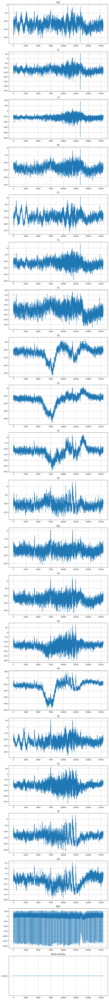

In [80]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df1.columns):
    ax[i].plot(df1.index, df1[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

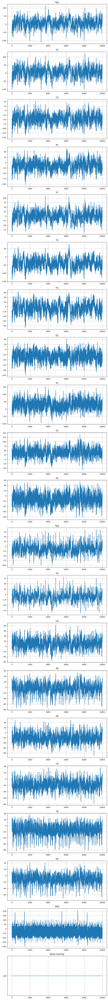

In [81]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df2.columns):
    ax[i].plot(df2.index, df2[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

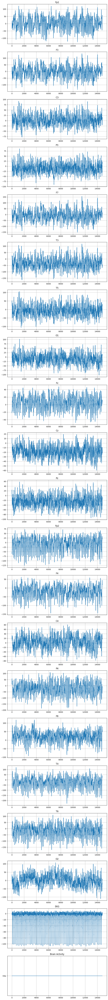

In [82]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df3.columns):
    ax[i].plot(df3.index, df3[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

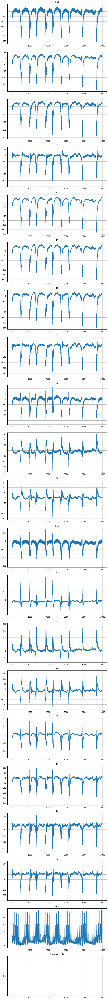

In [83]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df4.columns):
    ax[i].plot(df4.index, df4[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

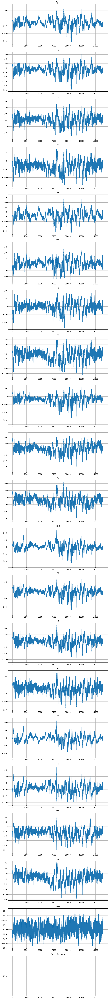

In [84]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df5.columns):
    ax[i].plot(df5.index, df5[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

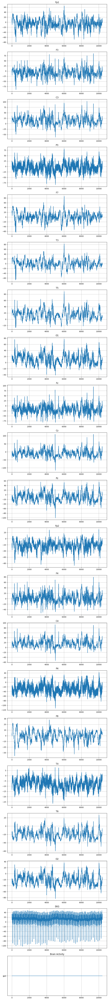

In [85]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(df6.columns):
    ax[i].plot(df6.index, df6[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

In [86]:
dfs = [df1, df2, df3, df4, df5, df6]

In [87]:
combined_df = pd.concat(dfs, ignore_index=True)

In [88]:
combined_df

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG,Brain Activity
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,...,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000,seizure
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,...,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999,seizure
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,...,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002,seizure
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,...,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003,seizure
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,...,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997,seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79595,2.200000,4.680000,24.139999,1.810000,2.480000,-1.520000,9.040000,9.890000,-1.090000,13.310000,...,-12.430000,15.260000,35.529999,-21.290001,4.710000,-0.110000,-9.420000,-17.980000,17.490000,gpd
79596,7.210000,6.740000,22.450001,19.160000,5.550000,-4.850000,7.730000,12.770000,6.180000,13.500000,...,-5.640000,19.870001,35.689999,-2.020000,3.600000,-3.850000,-9.430000,-15.530000,33.099998,gpd
79597,0.450000,-0.260000,16.540001,1.110000,0.390000,-6.090000,6.090000,7.620000,-4.360000,3.820000,...,-12.050000,13.640000,33.380001,-19.129999,2.200000,-2.660000,-10.930000,-19.520000,14.400000,gpd
79598,-2.450000,-3.070000,15.520000,-9.420000,-0.340000,-4.260000,7.190000,6.030000,-11.500000,-0.360000,...,-18.020000,9.680000,31.770000,-30.309999,2.210000,0.370000,-11.000000,-20.790001,9.730000,gpd


In [89]:
combined_df.shape

(79600, 21)

In [90]:
combined_df.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [91]:
combined_df.duplicated().sum()

0

In [92]:
df_new = combined_df.copy()

In [93]:
df_new.set_index('Brain Activity', inplace=True)

In [94]:
df_new

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
Brain Activity,,,,,,,,,,,,,,,,,,,,
seizure,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
seizure,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
seizure,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
seizure,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
seizure,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gpd,2.200000,4.680000,24.139999,1.810000,2.480000,-1.520000,9.040000,9.890000,-1.090000,13.310000,3.300000,-12.430000,15.260000,35.529999,-21.290001,4.710000,-0.110000,-9.420000,-17.980000,17.490000
gpd,7.210000,6.740000,22.450001,19.160000,5.550000,-4.850000,7.730000,12.770000,6.180000,13.500000,5.810000,-5.640000,19.870001,35.689999,-2.020000,3.600000,-3.850000,-9.430000,-15.530000,33.099998
gpd,0.450000,-0.260000,16.540001,1.110000,0.390000,-6.090000,6.090000,7.620000,-4.360000,3.820000,-0.190000,-12.050000,13.640000,33.380001,-19.129999,2.200000,-2.660000,-10.930000,-19.520000,14.400000


In [95]:
df_new.duplicated().sum()

0

In [96]:
combined_df.isnull().sum()

Fp1               0
F3                0
C3                0
P3                0
F7                0
T3                0
T5                0
O1                0
Fz                0
Cz                0
Pz                0
Fp2               0
F4                0
C4                0
P4                0
F8                0
T4                0
T6                0
O2                0
EKG               0
Brain Activity    0
dtype: int64

In [97]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79600 entries, 0 to 79599
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Fp1             79600 non-null  float32
 1   F3              79600 non-null  float32
 2   C3              79600 non-null  float32
 3   P3              79600 non-null  float32
 4   F7              79600 non-null  float32
 5   T3              79600 non-null  float32
 6   T5              79600 non-null  float32
 7   O1              79600 non-null  float32
 8   Fz              79600 non-null  float32
 9   Cz              79600 non-null  float32
 10  Pz              79600 non-null  float32
 11  Fp2             79600 non-null  float32
 12  F4              79600 non-null  float32
 13  C4              79600 non-null  float32
 14  P4              79600 non-null  float32
 15  F8              79600 non-null  float32
 16  T4              79600 non-null  float32
 17  T6              79600 non-null 

In [98]:
combined_df.describe()

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
count,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000,79600.000000
mean,-41.583023,-34.344395,-19.593449,-43.906509,-40.681980,-34.610428,-30.200079,-39.032101,-39.307823,-26.227566,-35.576687,-37.024082,-37.402420,-27.161121,-44.744511,-27.183712,-42.128857,-48.625900,-28.583515,-15.180623
std,63.754837,61.878197,68.721657,57.746696,72.008263,62.064209,59.604481,53.889336,77.715904,61.993980,46.344906,58.833183,55.770645,68.139755,71.277802,59.861328,49.474133,56.977894,51.839695,112.479141
min,-313.940002,-339.399994,-486.630005,-250.679993,-333.769989,-306.700012,-295.239990,-264.320007,-455.470001,-289.450012,-194.500000,-296.040009,-274.959991,-301.829987,-473.809998,-263.799988,-268.660004,-259.700012,-235.990005,-1515.810059
25%,-94.290001,-80.550003,-71.070000,-81.190002,-95.589996,-85.169998,-73.110001,-72.272497,-68.324999,-41.252500,-63.092500,-82.669998,-75.022497,-48.709999,-65.040001,-66.037498,-82.139999,-83.757500,-55.029999,-66.750000
50%,-25.020000,-16.375000,-1.635000,-22.860001,-19.395000,-22.600000,-8.170000,-24.190001,-15.160000,-11.510000,-23.160000,-22.780001,-19.250000,-0.210000,-26.850000,-8.125000,-28.010000,-28.650000,-12.910000,-4.790000
75%,5.932500,9.500000,25.799999,-3.070000,12.690000,12.460000,12.882500,0.300000,6.650000,10.790000,-2.390000,1.140000,-1.190000,15.780000,-6.570000,10.520000,-6.040000,-11.770000,7.400000,18.549999
max,161.330002,160.059998,199.960007,86.129997,164.539993,175.679993,105.540001,101.820000,152.490005,141.910004,153.559998,248.360001,265.269989,195.080002,162.869995,234.460007,120.160004,110.320000,114.470001,310.029999


In [99]:
combined_df.nunique()

Fp1               21817
F3                21311
C3                24593
P3                19277
F7                23752
T3                22382
T5                18862
O1                19891
Fz                24559
Cz                22225
Pz                17854
Fp2               20413
F4                19660
C4                20685
P4                20961
F8                20259
T4                17542
T6                18178
O2                18000
EKG               21705
Brain Activity        6
dtype: int64

In [100]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype in ['object', 'bool']:
            if df[column].nunique() < 15:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float32']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [101]:
categorical, non_categorical, discrete, continuous = classify_features(combined_df)

In [102]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['Brain Activity']
Non-Categorical Features: []
Discrete Features: []
Continuous Features: ['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz', 'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG']


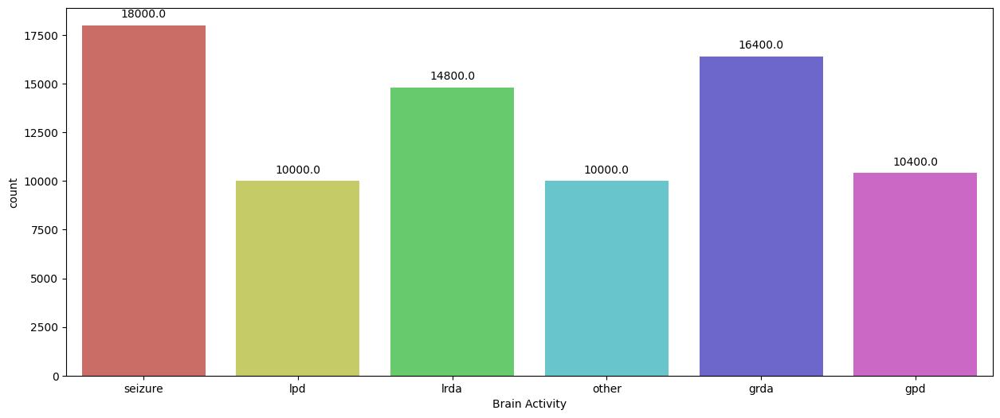

In [103]:
for i in categorical:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=combined_df, palette='hls')
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')
    plt.show()

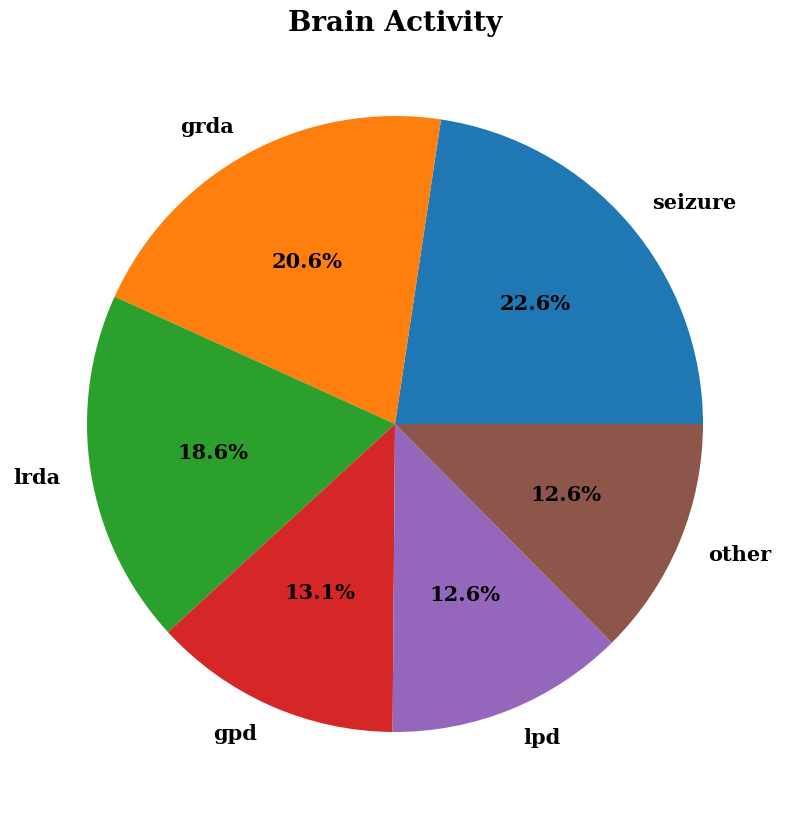

In [104]:
for i in categorical:
    plt.figure(figsize=(20,10))
    plt.pie(combined_df[i].value_counts(), labels=combined_df[i].value_counts().index, autopct='%1.1f%%', textprops={'fontsize': 15,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' })
    hfont = {'fontname':'serif', 'weight': 'bold'}
    plt.title(i, size=20, **hfont)
    plt.show()

## FEATURE ENGINEERING

In [105]:
numeric_df = combined_df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()

print("Correlation Matrix:")
correlation_matrix

Correlation Matrix:


,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
Fp1,1.000000,0.922691,0.595186,0.774480,0.917383,0.693449,0.767280,0.686133,0.737954,0.580770,0.580050,0.719942,0.648882,0.598511,0.409208,0.668227,0.614748,0.644395,0.580000,-0.050672
F3,0.922691,1.000000,0.801939,0.871557,0.940510,0.832053,0.873516,0.758184,0.780528,0.735617,0.709613,0.781523,0.735997,0.712857,0.502206,0.735251,0.644287,0.722297,0.720442,-0.107523
C3,0.595186,0.801939,1.000000,0.819604,0.744705,0.870966,0.854174,0.753480,0.615914,0.715175,0.734337,0.739804,0.689737,0.709163,0.516428,0.714517,0.550993,0.675898,0.792891,-0.174618
P3,0.774480,0.871557,0.819604,1.000000,0.860281,0.797943,0.937398,0.900825,0.733756,0.794581,0.884185,0.704763,0.736090,0.824218,0.609153,0.749402,0.685715,0.819826,0.846155,-0.098912
F7,0.917383,0.940510,0.744705,0.860281,1.000000,0.872692,0.891789,0.791115,0.728840,0.666632,0.681692,0.694591,0.658500,0.675653,0.494889,0.683219,0.656553,0.718828,0.705690,-0.072700
T3,0.693449,0.832053,0.870966,0.797943,0.872692,1.000000,0.903438,0.741974,0.558259,0.599255,0.663074,0.657965,0.593949,0.596024,0.418400,0.640434,0.577090,0.641219,0.698193,-0.116519
T5,0.767280,0.873516,0.854174,0.937398,0.891789,0.903438,1.000000,0.872422,0.654116,0.702037,0.768798,0.717110,0.670735,0.714420,0.514212,0.729792,0.663781,0.779924,0.809248,-0.107846
O1,0.686133,0.758184,0.753480,0.900825,0.791115,0.741974,0.872422,1.000000,0.756378,0.741840,0.800115,0.611448,0.625839,0.762039,0.729614,0.689719,0.658191,0.780937,0.838392,-0.067532
Fz,0.737954,0.780528,0.615914,0.733756,0.728840,0.558259,0.654116,0.756378,1.000000,0.860034,0.647241,0.743054,0.757614,0.796562,0.778416,0.719130,0.612627,0.682363,0.686969,-0.116340
Cz,0.580770,0.735617,0.715175,0.794581,0.666632,0.599255,0.702037,0.741840,0.860034,1.000000,0.836920,0.696975,0.780460,0.878246,0.777285,0.666769,0.613758,0.751121,0.796202,-0.177100


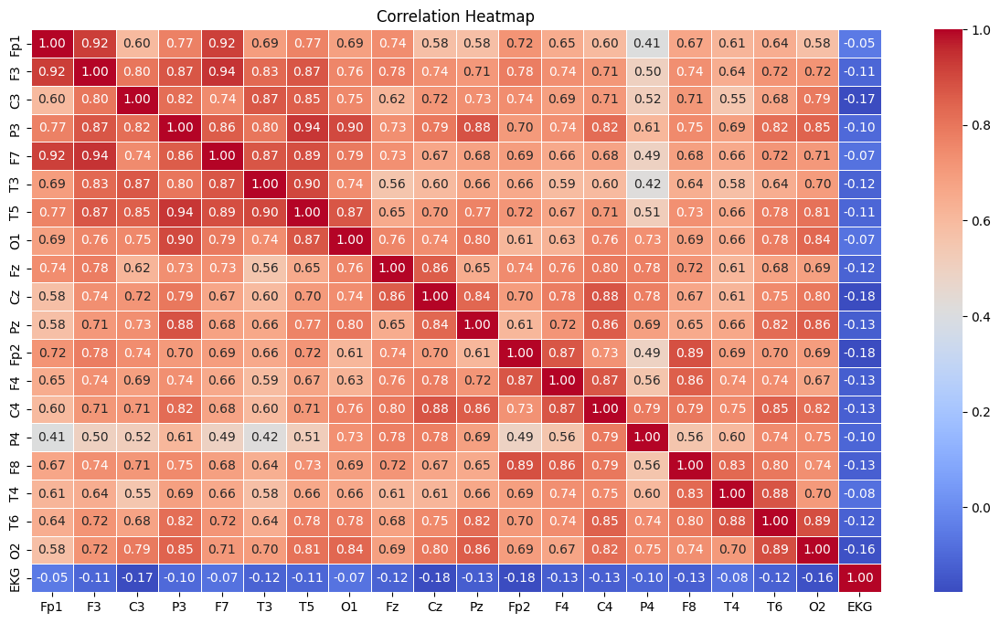

In [106]:
plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

In [107]:
combined_df.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG',
       'Brain Activity'],
      dtype='object')

In [108]:
# Ensure you are using the correct column names
# Example:
combined_df = combined_df[['C3', 'Cz', 'Fp2', 'O2', 'Brain Activity']]


In [109]:
# Assuming 'corr_matrix' is the correlation matrix you've created
# Extract correlation values for the 'EKG' column
ekg_corr = correlation_matrix['EKG']

# Filter values less than -0.16
filtered_features = ekg_corr[ekg_corr < -0.16]
print(filtered_features.index)


Index(['C3', 'Cz', 'Fp2', 'O2'], dtype='object')


In [110]:
brain_activities = combined_df['Brain Activity'].unique()
print(brain_activities)

['seizure' 'lpd' 'lrda' 'other' 'grda' 'gpd']


In [111]:
 
mapping = {activity: idx for idx, activity in enumerate(brain_activities)}

combined_df['Brain Activity Numerical'] = combined_df['Brain Activity'].map(mapping)

In [112]:
combined_df

,C3,Cz,Fp2,O2,Brain Activity,Brain Activity Numerical
0,-80.110001,-90.389999,-77.989998,-106.449997,seizure,0
1,-81.760002,-92.290001,-84.500000,-102.059998,seizure,0
2,-82.050003,-99.360001,-99.440002,-105.790001,seizure,0
3,-87.480003,-102.059998,-99.230003,-109.889999,seizure,0
4,-93.000000,-102.339996,-95.300003,-100.250000,seizure,0
...,...,...,...,...,...,...
79595,24.139999,13.310000,-12.430000,-17.980000,gpd,5
79596,22.450001,13.500000,-5.640000,-15.530000,gpd,5
79597,16.540001,3.820000,-12.050000,-19.520000,gpd,5
79598,15.520000,-0.360000,-18.020000,-20.790001,gpd,5


#### DEFINE X AND Y

In [113]:

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report , confusion_matrix

In [114]:
X = combined_df.drop(['Brain Activity Numerical','Brain Activity'], axis = 1)

In [115]:
X.head()

,C3,Cz,Fp2,O2
0,-80.110001,-90.389999,-77.989998,-106.449997
1,-81.760002,-92.290001,-84.500000,-102.059998
2,-82.050003,-99.360001,-99.440002,-105.790001
3,-87.480003,-102.059998,-99.230003,-109.889999
4,-93.000000,-102.339996,-95.300003,-100.250000


In [116]:
y = combined_df['Brain Activity Numerical']

In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y,
                                                    random_state=42)

In [118]:
X_train.columns

Index(['C3', 'Cz', 'Fp2', 'O2'], dtype='object')

## MODEL CREATION 

In [119]:
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [120]:
scaler = StandardScaler()
X_train_new = scaler.fit_transform(X_train)
X_test_new= scaler.transform(X_test)


The StandardScaler is a preprocessing technique used in machine learning to standardize the features of a dataset. Standardization involves transforming the data so that it has a mean of 0 and a standard deviation of 1. This process is also known as Z-score normalization.

Here's how the StandardScaler works:

Calculate Mean and Standard Deviation:

For each feature (column) in the dataset, calculate the mean and standard deviation.
Standardization Formula:

For each data point in a feature, apply the following formula:
Standardized Value
=
Original Value
−
Mean
Standard Deviation
Standardized Value=
Standard Deviation
Original Value−Mean
​

Result:

After standardization, each feature will have a mean of 0 and a standard deviation of 1.
The StandardScaler is beneficial in scenarios where features have different scales or units. Standardizing the features ensures that they are on a similar scale, which can be important for algorithms that are sensitive to the scale of the input features. Some machine learning algorithms, such as support vector machines, k-means clustering, and principal component analysis, work more effectively when features are standardized.

In [121]:
X_train_new.shape,

((55720, 4),)

In [122]:
X_train_new

array([[-1.7833166e-03,  5.0879866e-01, -2.4688677e-01, -4.6763167e-02],
       [-1.1142133e+00, -1.2465183e+00, -1.1766791e+00, -1.4485543e+00],
       [-6.6900903e-01,  1.4406583e-01,  6.3044041e-02,  2.2977933e-01],
       ...,
       [ 1.1926887e+00,  7.4182242e-01,  1.1489046e+00,  1.5300108e+00],
       [-1.4526906e+00, -1.6789550e+00, -1.4947526e+00, -1.7630612e+00],
       [-1.2181815e+00, -1.6463091e+00, -1.7039177e+00, -2.0008683e+00]],
      dtype=float32)

In [123]:
y_train

23444    1
2501     0
26279    1
64460    4
49332    3
        ..
53184    4
22952    1
54539    4
3616     0
11438    0
Name: Brain Activity Numerical, Length: 55720, dtype: int64

In [124]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)

In [125]:
y_train_one_hot


array([[0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.]])

In [126]:
y_test_one_hot = to_categorical(y_test)

In [127]:
y_test_one_hot

array([[0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.]])

The provided model summary belongs to a neural network model built using the Keras library with a Sequential API. Let's break down the key components of the model summary:

### Model Architecture:
- **Model Type:** Sequential
  - The Sequential model is a linear stack of layers, where you can simply add one layer at a time.
  
### Layers:
1. **Dense Layer (dense_6):**
   - **Output Shape:** (None, 64)
   - **Number of Parameters:** 256
   - This layer is a fully connected (dense) layer with 64 units. The output shape is (None, 64), indicating that the layer produces an output vector with 64 values for each input.

2. **Dense Layer (dense_7):**
   - **Output Shape:** (None, 32)
   - **Number of Parameters:** 2080
   - Another fully connected layer with 32 units. The output shape is (None, 32).

3. **Dense Layer (dense_8):**
   - **Output Shape:** (None, 6)
   - **Number of Parameters:** 198
   - Final dense layer with 6 units, representing the output layer for a classification task with 6 classes. The output shape is (None, 6).

### Total Parameters:
- **Total Parameters:** 2,534
- **Trainable Parameters:** 2,534
- **Non-trainable Parameters:** 0
  - Trainable parameters are the weights and biases in the layers that the model learns during training. Non-trainable parameters could be, for example, the parameters in a BatchNormalization layer, but in this case, there are none.

### Note:
- The activation function used in each dense layer is not specified in the provided summary. By default, Keras uses the linear activation function.
- The model is designed for a classification task with 6 classes based on the last dense layer having 6 units.
- The model architecture is relatively simple with one input layer, two hidden layers, and one output layer. Adjustments to the architecture, such as activation functions and layer sizes, can be made based on the specific requirements of your task.

In Keras, the model.compile method is used to configure the learning process of a neural network model before training. It essentially sets up the model for training by specifying three key components:

Optimizer: The optimizer is the algorithm responsible for updating the weights of the neural network during training. It controls how the model adjusts its internal parameters to minimize the loss function. Common optimizers include SGD (Stochastic Gradient Descent), Adam, RMSprop, etc.

Loss Function: The loss function, or objective function, quantifies how well the model is performing. It measures the difference between the predicted output and the actual target values. The goal during training is to minimize this loss. The choice of the loss function depends on the type of problem (e.g., classification, regression) and the nature of the output.

Metrics: Metrics are used to evaluate the performance of the model. While the loss function is used during training to guide the optimization process, metrics provide additional measures of model performance that are easier to interpret. Common metrics for classification tasks include accuracy, precision, recall, and F1-score.

In [129]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout


In [130]:
X_train_new

array([[-1.7833166e-03,  5.0879866e-01, -2.4688677e-01, -4.6763167e-02],
       [-1.1142133e+00, -1.2465183e+00, -1.1766791e+00, -1.4485543e+00],
       [-6.6900903e-01,  1.4406583e-01,  6.3044041e-02,  2.2977933e-01],
       ...,
       [ 1.1926887e+00,  7.4182242e-01,  1.1489046e+00,  1.5300108e+00],
       [-1.4526906e+00, -1.6789550e+00, -1.4947526e+00, -1.7630612e+00],
       [-1.2181815e+00, -1.6463091e+00, -1.7039177e+00, -2.0008683e+00]],
      dtype=float32)

from tensorflow.keras import models, layers

# Reshape X_train_new: each sample is now a sequence of 3 timesteps with 1 feature
X_train_new_reshaped = X_train_new.reshape((X_train_new.shape[0], X_train_new.shape[1], 1))

# Define the LSTM model
model_lstm = models.Sequential([
    # LSTM layer to capture temporal patterns
   layers.Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train_new.shape[1], 1)),
    layers.MaxPooling1D(pool_size=2),
    
    layers.Conv1D(128, kernel_size=3, activation='relu'),
    layers.MaxPooling1D(pool_size=2),

    # LSTM layer to capture temporal patterns
    layers.LSTM(64, return_sequences=True),
    layers.LSTM(32),

    # Dense layer for further feature extraction
    layers.Dense(32, activation='relu'),

    # Output layer for seizure prediction (assuming 6 classes)
    layers.Dense(6, activation='softmax')
])

# Model summary to show architecture
model_lstm.summary()


from tensorflow.keras import models, layers

# Reshape X_train_new: each sample is now a sequence of 3 timesteps with 1 feature
X_train_new_reshaped = X_train_new.reshape((X_train_new.shape[0], X_train_new.shape[1], 1))

# Define the LSTM model
model_lstm = models.Sequential([
    # LSTM layer to capture temporal patterns
    layers.LSTM(64, activation='tanh', input_shape=(X_train_new.shape[1], 1)),
    
    # Dense layer for further feature extraction
    layers.Dense(32, activation='relu'),
    
    # Output layer for seizure prediction (assuming 6 classes)
    layers.Dense(6, activation='softmax')
])




In [134]:
# Attention mechanism block (Self-attention)
def attention_block(inputs):
    channels = inputs.shape[-1]
    attention = GlobalAveragePooling2D()(inputs)
    attention = Dense(channels // 8, activation='relu')(attention)
    attention = Dense(channels, activation='sigmoid')(attention)
    attention = Reshape((1, 1, channels))(attention)
    attention = Multiply()([inputs, attention])
    return attention


In [132]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Reshape X_train_new: each sample is now a sequence of 3 timesteps with 1 feature
X_train_new_reshaped = X_train_new.reshape((X_train_new.shape[0], X_train_new.shape[1], 1))

# Define a more complex model
model_complex = models.Sequential([

    # 1D Convolution layer to capture local temporal patterns
    layers.Conv1D(128, kernel_size=3, activation='relu', input_shape=(X_train_new.shape[1], 1)),
    layers.MaxPooling1D(pool_size=2),
    
    # BiLSTM layer to capture temporal patterns in both directions
    layers.Bidirectional(layers.LSTM(64, return_sequences=True)),

    # Attention mechanism to focus on important timesteps
    Attention(),
    
    # Dense layer for further feature extraction
    layers.Dense(64, activation='relu'),

    # Output layer for seizure prediction (assuming 6 classes)
    layers.Dense(6, activation='softmax')
])

# Compile the model
model_complex.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary to show architecture
model_complex.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 2, 128)         │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 1, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 1, 128)         │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ attention (Attention)           │ (None, 128)            │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,614 (486.77 KB)

 Trainable params: 124,614 (486.77 KB)

 Non-trainable params: 0 (0.00 B)

In [133]:
# Train the model
history_complex = model_complex.fit(X_train_new_reshaped, y_train_one_hot, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7422 - loss: 0.6860 - val_accuracy: 0.8814 - val_loss: 0.3272
Epoch 2/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.8984 - loss: 0.2842 - val_accuracy: 0.9014 - val_loss: 0.2632
Epoch 3/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9030 - loss: 0.2571 - val_accuracy: 0.9095 - val_loss: 0.2536
Epoch 4/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9098 - loss: 0.2445 - val_accuracy: 0.9124 - val_loss: 0.2367
Epoch 5/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9112 - loss: 0.2353 - val_accuracy: 0.9104 - val_loss: 0.2478
Epoch 6/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9137 - loss: 0.2282 - val_accuracy: 0.9140 - val_loss: 0.2356
Epoch 7/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9173 - loss: 0.2222 - val_accuracy: 0.9087 - val_loss: 0.2407
Epoch 8/20
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9146 - loss: 0.2272 -

1. **Input Shape Definition:**
   - The input data shape is defined, indicating the number of features and channels.

2. **Model Initialization:**
   - A sequential model is initialized. In a sequential model, layers are added one by one in a linear sequence.

3. **Convolutional Layer Addition:**
   - A 1D convolutional layer is added to the model.
     - `filters`: Specifies the number of filters in the convolutional layer.
     - `kernel_size`: Sets the size of the convolutional kernel.

4. **Flatten Layer Addition:**
   - A flatten layer is added to the model.
     - This layer is used to flatten the multi-dimensional data into a one-dimensional array.

5. **Dense Layer Addition (1st):**
   - A dense layer with ReLU activation is added to the model.
     - This layer is fully connected, meaning each neuron in the layer is connected to every neuron in the previous layer.

6. **Dense Layer Addition (2nd):**
   - Another dense layer with softmax activation is added to the model.
     - Softmax activation is often used in the output layer for multi-class classification problems.

In [ ]:
# Train the model
history_complex = model_complex.fit(X_train_new_reshaped, y_train_one_hot, epochs=20, batch_size=32, validation_split=0.2)


In [ ]:
y_pred_probs = model_complex.predict(X_test_new)

# Round probabilities to 2 decimal places
y_pred_rounded = np.round(y_pred_probs, 2)

print(y_pred_rounded)

1. **Conv1D Layer:**
   - Type: Conv1D
   - Output Shape: (None, 1, 64)
   - Parameters: 256
   - Explanation: This layer applies 64 filters of size 3 to the input data, resulting in an output shape of (1, 64) for each filter.

2. **Flatten Layer:**
   - Type: Flatten
   - Output Shape: (None, 64)
   - Parameters: 0
   - Explanation: This layer flattens the output from the Conv1D layer into a one-dimensional array with 64 elements.

3. **Dense Layer (1st):**
   - Type: Dense
   - Output Shape: (None, 128)
   - Parameters: 8,320
   - Explanation: This fully connected layer has 128 neurons with a ReLU activation function. It takes the flattened input from the previous layer.

4. **Dense Layer (2nd):**
   - Type: Dense
   - Output Shape: (None, 6)
   - Parameters: 774
   - Explanation: The final layer is another fully connected layer with 6 neurons, representing the number of classes in the classification task. It uses the softmax activation function.

5. **Total Parameters:**
   - Total trainable parameters in the model: 9,350
   - Non-trainable parameters: 0
   - Trainable parameters are the weights and biases in the model that are updated during training to learn from the data. Non-trainable parameters are fixed and not updated during training.

This model architecture is suitable for a multi-class classification problem where the input data has sequential features. The convolutional layer helps capture local patterns in the input sequence.

- **`X_train_new.reshape(X_train_new.shape[0], X_train_new.shape[1], 1)`**: This reshapes the input data (`X_train_new`) to be compatible with the Conv1D layer's input shape. It adds an additional dimension with size 1, indicating that the data has a single channel. The reshaped data is then used for training.

- **`y_train_one_hot`**: This represents the one-hot encoded labels corresponding to the training data.

- **`epochs=20`**: This specifies the number of times the entire dataset will be passed forward and backward through the neural network during training.

- **`batch_size=32`**: It defines the number of samples that will be used in each iteration of training.

- **`validation_split=0.2`**: This parameter is used for validation during training. It indicates that 20% of the training data will be used as a validation set, and the model's performance will be evaluated on this set after each epoch.

The `fit` method will train the model for the specified number of epochs, and the training/validation loss and accuracy metrics for each epoch will be stored in the `history_cnn` variable. This information can be used to analyze the training process and evaluate the model's performance.

In [ ]:
pd.read_csv("/kaggle/input/hms-harmful-brain-activity-classification/sample_submission.csv")

In [ ]:
test_df = pd.read_parquet('/kaggle/input/hms-harmful-brain-activity-classification/test_eegs/3911565283.parquet')
test_df


In [ ]:
fig, ax = plt.subplots(21, figsize=(10, 100))

for i, column in enumerate(test_df.columns):
    ax[i].plot(test_df.index, test_df[column], label=column)
    ax[i].grid(True)
    ax[i].set_title(str(column))

plt.show()

In [ ]:
scaled_test_df=scaler.transform(test_df[['C3', 'Cz', 'Fp2', 'O2']])
y_pred_probs = model_complex.predict(scaled_test_df)

# Round probabilities to 2 decimal places
y_pred_rounded = np.round(y_pred_probs, 2)

print(y_pred_rounded[0])
print(y_pred_rounded[0].sum( ))

In [ ]:
import numpy as np

# Set the max probability in each row to 1, others to 0
y_pred_max = np.zeros_like(y_pred_rounded)
y_pred_max[np.arange(len(y_pred_rounded)), y_pred_rounded.argmax(axis=1)] = 1

# Sum column-wise and divide by the total number of rows to get the class probability
class_probabilities = y_pred_max.sum(axis=0) / len(y_pred_max)

print(class_probabilities)


In [ ]:
count=0
for i in class_probabilities:
    print(i)

In [ ]:
sub_data=pd.read_csv("/kaggle/input/hms-harmful-brain-activity-classification/sample_submission.csv")

In [ ]:
sub_data


In [ ]:
# Assign the values to the appropriate columns
sub_data.loc[0, ['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']] = class_probabilities


In [ ]:
sub_data

In [ ]:
sub_data.to_csv("submission.csv", index=False)